In [6]:
"""
Run this on your machine/cluster where /network is mounted, and paste the
printed output back. Just need structure (vars, dims, sizes) -- not data.
"""
import glob
import xarray as xr

def describe(name, ds):
    print(f"\n=== {name} ===")
    print("data_vars:", list(ds.data_vars))
    print("dims:", dict(ds.dims))
    print("coords:", list(ds.coords))
    for c in ds.coords:
        if ds.coords[c].size < 6:
            print(f"  {c} values:", ds.coords[c].values)
        else:
            print(f"  {c} range:", ds.coords[c].values[0], "...", ds.coords[c].values[-1],
                  f"(n={ds.coords[c].size})")

# 1. CMIP historical/ssp files (global grid, per-model .nc)
cmip_files = sorted(glob.glob("../Network/historical_ssp/*2001_2020.nc"))
print(f"CMIP files found: {len(cmip_files)}")
print(cmip_files[:3])
if cmip_files:
    describe("CMIP (first file)", xr.open_dataset(cmip_files[0]))

# 2. AMIP / dtree_zarr_output_now files
amip_files = sorted(glob.glob("/network/group/aopp/predict/MRA001_AYIM_REFORCST/dtree_zarr_output_now/*.nc"))
print(f"\nAMIP files found: {len(amip_files)}")
print(amip_files[:3])
if amip_files:
    describe("AMIP (first file)", xr.open_dataset(amip_files[0]))

# 3. ERA5 zarr
era = xr.open_zarr('/network/group/aopp/predict/AWH020_AYIM_EXTREME/ERA5/era5_t2m/nick_testing/all_years.zarr')
describe("ERA5 zarr", era)

# 4. Reforecast zarr
refore = xr.open_zarr('/network/group/aopp/predict/MRA001_AYIM_REFORCST/full_refore.zarr')
describe("Reforecast zarr", refore)


CMIP files found: 6
['../Network/historical_ssp/CNRM-CM6-1_2001_2020.nc', '../Network/historical_ssp/CNRM-ESM2-1_2001_2020.nc', '../Network/historical_ssp/EC-Earth3_2001_2020.nc']


KeyboardInterrupt: 

In [1]:

import glob
import os

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

import matplotlib.colors as mcolors

## Config

In [2]:
ERA5_PATH = "/network/group/aopp/predict/AWH020_AYIM_EXTREME/ERA5/era5_t2m/nick_testing/all_years.zarr"
REFORECAST_PATH = "/network/group/aopp/predict/MRA001_AYIM_REFORCST/full_refore.zarr"
CMIP_GLOB = "Network/historical_ssp/*2001_2020.nc"
AMIP_GLOB = "/network/group/aopp/predict/MRA001_AYIM_REFORCST/dtree_zarr_output_now/*.nc"
CMIP_VAR = "tasmax"
LEAD_DAY = 12  # must match the reforecast zarr's fixed lead (checked at runtime)

# Restrict to the first N inidates (chronologically) so the season window matches the original
# refore.csv-based averaged-series reforecast. N_INIDATES=11 -> 06-15..07-24 (confirmed against
# the CSV). Set to None to use all 25 available inidates instead (06-15..09-11 -- note 3 of those
# fall outside JJA, in early September) for a broader-season run; see the intro markdown cell's
# discussion for why pooling more dates needs day-of-year de-seasonalizing to be valid.
N_INIDATES = 11

THRESHOLD_PERCENTILE = 95  # top 5%, same convention as the scalar notebooks
ANOMALY = True  # center each cell on its own time-mean first (matches empirical_tail_slope)

# Spatial chunk sizes for dask parallelism (tune to your cluster)
CHUNK_LAT = 90
CHUNK_LON = 180

# PNW box, for a sanity cross-check against the scalar (box-averaged) results
CMIP_LAT_BOUNDS = (45, 52)
CMIP_LON_BOUNDS = (-123, -119)

OUT_PREFIX = "gridded"

# Regions of interest for the area-vs-model comparison: name -> (lat_bounds, lon_bounds), both
# in -180..180 lon (box_mean converts to 0..360 automatically for grids that need it, e.g. ERA5).
# Deliberately climate-CONTRASTING, not just other heatwave-history regions -- the point is to
# stress-test whether the reforecast and the empirical tail-slope method are robust across
# fundamentally different thermal/variance regimes, not just reproduce PNW-like results elsewhere.
# All bounds are in (min, max) or (max, min) order -- box_mean handles either. Adjust freely.
REGIONS = {
    "PNW": ((45, 52), (-123, -119)),        # temperate maritime -- the original 2021 case, kept as anchor
    "Sahara": ((20, 28), (0, 15)),           # hyper-arid desert -- extreme heat, very different variance structure
    "Amazon Basin": ((-8, 3), (-70, -55)),   # tropical -- minimal seasonal cycle, different tail behavior
    "Siberia": ((60, 68), (90, 120)),        # subarctic/continental -- cold-dominated, heat is not the norm here
}

plt.rcParams.update({
    "font.family": "serif", "font.serif": ["Times New Roman", "DejaVu Serif"], "font.size": 9,
    "axes.labelsize": 9, "axes.titlesize": 9, "xtick.labelsize": 8, "ytick.labelsize": 8,
    "figure.dpi": 150, "savefig.dpi": 300, "savefig.bbox": "tight", "savefig.pad_inches": 0.05,
    
})


#read the txt file
rgb_data_in_the_txt_file = np.loadtxt("../new_project/personal_cmaps/misc_div.txt")
#rgb_data_in_the_txt_file = np.loadtxt("../new_project/personal_cmaps/misc_seq_2.txt")
#create the colormap
my_colormap = mcolors.LinearSegmentedColormap.from_list('colormap', (rgb_data_in_the_txt_file/255))


## Vectorized per-cell empirical tail-slope

In [3]:
def empirical_tail_slope_grid(data: xr.DataArray, sample_dim: str,
                               threshold_percentile: float = THRESHOLD_PERCENTILE,
                               anomaly: bool = ANOMALY) -> xr.Dataset:
    """
    Per-cell version of fit_gumbel_simple.empirical_tail_slope(). `data` must
    already be filtered to the sample set you want pooled at each cell (e.g.
    ERA5/CMIP: target-season days across all years; reforecast: the stacked
    hDate x inidate x number ensemble) -- every cell sees the same sample
    COUNT, which is what makes the fixed top-K vectorization valid.
    """
    n = data.sizes[sample_dim]
    K = int(round((100 - threshold_percentile) / 100 * n))
    if K < 2:
        raise ValueError(f"only {K} exceedances at {threshold_percentile}th pct of n={n} -- need >= 2")

    ranks = np.arange(1, K + 1)
    log_survival = np.log((K + 1 - ranks) / (K + 1))
    y_mean = log_survival.mean()
    yc = log_survival - y_mean
    ss_tot = float((yc ** 2).sum())

    def _fit(arr):
        if anomaly:
            arr = arr - arr.mean(axis=-1, keepdims=True)
        top_k = np.sort(arr, axis=-1)[..., -K:]
        x_mean = top_k.mean(axis=-1, keepdims=True)
        xc = top_k - x_mean
        denom = (xc ** 2).sum(axis=-1)
        # Degenerate cells (near-constant top-K values, e.g. some polar/masked points) give
        # denom ~ 0, which blows slope/rarity_factor up to nonsense (1e6+) instead of erroring --
        # that silently wrecks both plot color scales and box-mean averages. Mark them NaN
        # explicitly instead so downstream skipna/percentile handling can ignore them cleanly.
        # Scale must be PER CELL (axis=-1) -- np.nanmax(np.abs(xc)) with no axis reduces over
        # the whole dask chunk, so a cell with a genuinely tiny-relative-to-itself denom could
        # dodge the cutoff just because some other cell in the same chunk had a large anomaly,
        # letting slope explode (seen: rarity_factor up to ~25000 instead of the usual ~1-12).
        cell_scale = np.maximum(np.nanmax(np.abs(xc), axis=-1), 1.0)
        degenerate = denom < 1e-8 * cell_scale ** 2
        with np.errstate(invalid="ignore", divide="ignore"):
            slope = (xc * yc).sum(axis=-1) / denom
        intercept = y_mean - slope * x_mean.squeeze(-1)
        pred = slope[..., None] * top_k + intercept[..., None]
        ss_res = ((log_survival - pred) ** 2).sum(axis=-1)
        with np.errstate(invalid="ignore", divide="ignore"):
            r2 = 1 - ss_res / ss_tot
        threshold = top_k[..., 0]
        with np.errstate(over="ignore"):
            rarity_factor = np.exp(-slope)
        slope = np.where(degenerate, np.nan, slope)
        intercept = np.where(degenerate, np.nan, intercept)
        r2 = np.where(degenerate, np.nan, r2)
        rarity_factor = np.where(degenerate, np.nan, rarity_factor)
        return threshold, slope, intercept, r2, rarity_factor

    threshold, slope, intercept, r2, rarity_factor = xr.apply_ufunc(
        _fit, data,
        input_core_dims=[[sample_dim]],
        output_core_dims=[[], [], [], [], []],
        dask="parallelized",
        output_dtypes=[float, float, float, float, float],
    )
    out = xr.Dataset({
        "threshold": threshold, "slope": slope, "intercept": intercept,
        "r2": r2, "rarity_factor_per_plus1degC": rarity_factor,
    })
    out.attrs.update(m=K, threshold_percentile=threshold_percentile, anomaly=int(anomaly))
    return out

## Cross-check & plotting helpers

In [4]:
def select_box(out: xr.Dataset, lat_bounds=CMIP_LAT_BOUNDS, lon_bounds=CMIP_LON_BOUNDS) -> xr.Dataset:
    """
    Crop a gridded Dataset to a lat/lon box, handling both -180..180 and 0..360 longitude
    conventions (bounds are given in -180..180; converted automatically for a 0..360 grid like
    ERA5's -- otherwise -123..-119 silently selects zero cells there) and either latitude
    ordering (ascending like CMIP, or descending like ERA5/reforecast). Raises instead of
    silently returning an empty selection.
    """
    lat_lo, lat_hi = lat_bounds
    lon_lo, lon_hi = lon_bounds
    if float(out["lon"].min()) >= 0:
        lon_lo, lon_hi = lon_lo % 360, lon_hi % 360
    box = out.sel(lat=slice(min(lat_lo, lat_hi), max(lat_lo, lat_hi)), lon=slice(min(lon_lo, lon_hi), max(lon_lo, lon_hi)))
    if box.sizes.get("lat", 0) == 0:
        box = out.sel(lat=slice(max(lat_lo, lat_hi), min(lat_lo, lat_hi)), lon=slice(min(lon_lo, lon_hi), max(lon_lo, lon_hi)))
    if box.sizes.get("lat", 0) == 0 or box.sizes.get("lon", 0) == 0:
        raise ValueError(f"box selection is empty (lat={lat_bounds}, lon={lon_bounds} -> "
                          f"resolved to lon={lon_lo, lon_hi}) -- check the grid's lat/lon convention")
    return box


def box_mean(out: xr.Dataset, lat_bounds=CMIP_LAT_BOUNDS, lon_bounds=CMIP_LON_BOUNDS) -> dict:
    """Area-weighted mean over a lat/lon box, as a cheap cross-check against the scalar notebooks' numbers."""
    box = select_box(out, lat_bounds, lon_bounds)
    weights = np.cos(np.deg2rad(box["lat"]))
    return {k: float(box[k].weighted(weights).mean(skipna=True).compute()) for k in
            ["slope", "r2", "rarity_factor_per_plus1degC"]}


def to_180_lon(da: xr.DataArray) -> xr.DataArray:
    """
    Plotting-only longitude normalization to -180..180. ERA5 is natively 0..360; CMIP and the
    reforecast are natively -180..180 -- left as-is, this makes ERA5 maps read on a 0-360 axis
    while the others read -180..180, which is confusing to compare side by side even though the
    underlying data/analysis (select_box, box_mean, mask_ocean) are already convention-agnostic
    and don't need this. No-op if already -180..180. Re-sorts after the wrap so lon stays
    monotonic -- required for correct pcolormesh rendering, otherwise there's a jump at 180.
    """
    if float(da["lon"].min()) < 0:
        return da
    new_lon = ((da["lon"] + 180) % 360) - 180
    return da.assign_coords(lon=new_lon).sortby("lon")


def mask_ocean(da: xr.DataArray) -> xr.DataArray:
    """
    Mask out ocean cells using regionmask's Natural Earth 110m land polygon (pip install
    regionmask). .mask() handles both -180..180 and 0..360 longitude conventions natively --
    no manual conversion needed, unlike select_box's PNW-box logic.
    """
    try:
        import regionmask
    except ImportError as e:
        raise ImportError("mask_ocean() requires the 'regionmask' package (pip install "
                           "regionmask) -- or pass mask_ocean_cells=False to skip land masking.") from e
    land = regionmask.defined_regions.natural_earth_v5_0_0.land_110
    land_mask = land.mask(da["lon"], da["lat"])
    return da.where(np.isfinite(land_mask))


def _discrete_log_levels(data, n_levels: int = 10, vmin=None, vmax=None) -> np.ndarray:
    """n_levels+1 log-spaced bin edges spanning the 2nd/98th percentile of data's finite, positive
    values (rarity_factor is always > 0; a log scale can't represent <= 0 values anyway). `data`
    can be a DataArray or a plain array -- just needs to support np.asarray()."""
    values = np.asarray(data)
    finite = values[np.isfinite(values) & (values > 0)]
    if vmin is None or vmax is None:
        if finite.size:
            pmin, pmax = np.nanpercentile(finite, [2, 98])
            vmin = pmin if vmin is None else vmin
            vmax = pmax if vmax is None else vmax
        else:
            vmin, vmax = 1.0, 2.0
    return np.geomspace(max(vmin, 1e-6), max(vmax, vmin * 1.01), n_levels + 1)


def plot_tail_slope_map(out: xr.Dataset, field: str = "rarity_factor_per_plus1degC",
                         cmap: str = "viridis", title: str = None, vmin=None, vmax=None,
                         n_levels: int = 10, mask_ocean_cells: bool = True):
    da = out[field].compute()
    if mask_ocean_cells:
        da = mask_ocean(da)
    da = to_180_lon(da)
    levels = _discrete_log_levels(da, n_levels=n_levels, vmin=vmin, vmax=vmax)
    cmap_obj = plt.get_cmap(cmap, n_levels + 2)  # +2 colors for extend="both" (below-min, above-max bins)
    norm = BoundaryNorm(levels, ncolors=cmap_obj.N, extend="both")
    tick_labels = [f"{x:.2g}" for x in levels]

    if HAS_CARTOPY:
        proj = ccrs.Robinson(central_longitude=0)
        fig, ax = plt.subplots(figsize=(10, 5), subplot_kw={"projection": proj})
        mesh = da.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), norm=norm, cmap=cmap_obj,
                                   add_colorbar=False, shading="auto", rasterized=True)
        ax.add_feature(cfeature.LAND, facecolor="none")
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)
        gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.4)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {"size": 9}
        gl.ylabel_style = {"size": 9}
        cax = fig.add_axes([0.13, 0.02, 0.74, 0.045])
        cbar = fig.colorbar(mesh, cax=cax, orientation="horizontal", extend="both")
        cbar.set_ticks(levels)
        cbar.ax.minorticks_off()
        cbar.set_ticklabels(tick_labels)
        cbar.set_label(field)
    else:
        fig, ax = plt.subplots(figsize=(9, 4.5))
        mesh = ax.pcolormesh(da["lon"], da["lat"], da, cmap=cmap_obj, norm=norm, shading="auto")
        fig.colorbar(mesh, ax=ax, label=field, shrink=0.85, ticks=levels,
                     format=lambda x, _: f"{x:.2g}")
        ax.set_xlabel("lon")
        ax.set_ylabel("lat")

    ax.set_title(title or field)
    return fig

## Data loading (global grid, no box selection)

In [5]:
def compute_target_mmdd(refore_ds: xr.Dataset, lead_day: int, n_inidates: int = None):
    """
    Calendar mm-dd of the reforecast's valid dates (inidate + lead), independent of hDate.
    n_inidates=None uses every inidate in the zarr (25, spanning 06-15..09-11 -- note 3 of
    those fall outside JJA). n_inidates=11 matches the original refore.csv-based averaged
    series: the first 11 inidates chronologically (06-15..07-24).
    Returns (target_mmdd: set, selected_inidates: array of the actual inidate coord values used).
    """
    lead_days = refore_ds["time"].values / np.timedelta64(1, "D")
    lead_days = np.atleast_1d(lead_days)
    if not np.allclose(lead_days, lead_day):
        raise ValueError(f"reforecast zarr's 'time' (lead) is {lead_days} days, expected {lead_day} -- "
                          f"LEAD_DAY config doesn't match the file")
    inidates = pd.to_datetime(refore_ds["inidate"].values)
    selected_inidates = np.sort(inidates.values)
    if n_inidates is not None:
        selected_inidates = selected_inidates[:n_inidates]
    valid_dates = pd.to_datetime(selected_inidates) + pd.Timedelta(days=lead_day)
    return set(valid_dates.strftime("%m-%d")), selected_inidates


def _maybe_kelvin_to_celsius(da: xr.DataArray) -> xr.DataArray:
    units = da.attrs.get("units", "").lower()
    if units == "k":
        return da - 273.15
    if units in ("c", "degc", "degrees_c", ""):
        corner = da.isel({d: slice(0, min(3, da.sizes[d])) for d in da.dims})
        if float(corner.mean().compute()) > 100:
            return da - 273.15
    return da


def open_reforecast_dataset(path: str) -> xr.Dataset:
    """
    Opens full_refore.zarr with CF time decoding, working around a data-integrity issue in the
    archive: some 'inidate' entries hold a garbage raw day-offset (seen: 94393094605038 days
    since 2021-06-03, ~2.6e11 years out) instead of a real single/double-digit offset. CF
    decoding converts the whole 'inidate' array in one vectorized pass, so that one corrupted
    label overflows pandas'/cftime's datetime range and crashes the open for the ENTIRE dataset
    -- 'time' (the lead, a harmless bare 'days' duration) is unaffected on its own. Filter the
    raw values first (decode_times=False keeps them un-decoded) and drop anything implausible
    for this archive -- real inidates are day-offsets spanning one season, i.e. small -- before
    decoding, so one corrupted coordinate label doesn't block loading the rest of an otherwise
    good dataset.
    """
    ds = xr.open_zarr(path, decode_times=False)
    raw_inidate = np.atleast_1d(ds["inidate"].values)
    valid = np.abs(raw_inidate) < 3650  # generous: within ~10 years of the reference date
    n_bad = int((~valid).sum())
    if n_bad:
        print(f"open_reforecast_dataset: dropping {n_bad}/{raw_inidate.size} 'inidate' entries "
              f"with implausible raw day-offsets (e.g. {raw_inidate[~valid][:5]}) -- likely "
              f"corrupted coordinate labels in the archive")
        ds = ds.isel(inidate=valid)
    return xr.decode_cf(ds, decode_timedelta=True)


def drop_nan_samples(da: xr.DataArray, sample_dim: str) -> xr.DataArray:
    """
    Drop any sample-dim slice (a whole hDate/inidate/number combo for the reforecast, or a
    whole time step for ERA5/CMIP) that has a NaN anywhere in the spatial grid.

    empirical_tail_slope_grid's fixed top-K vectorization requires every cell to see the same
    sample COUNT, so NaNs can't be dropped per-cell -- and np.sort() sorts NaN to the end
    (treats it as the largest value), so even a single NaN sample silently lands inside a
    cell's top-K exceedances and NaNs out that cell's whole slope/rarity_factor. A real gap in
    the source data (e.g. one reforecast run that was never written for part of the grid) then
    shows up as a clean blanked-out region on the map instead of an error -- this is what
    produced the missing eastern-Australia patch in the reforecast map. Dropping the whole bad
    sample keeps the sample count uniform across cells and surfaces the loss explicitly (via
    the printed count) instead of silently.
    """
    other_dims = [d for d in da.dims if d != sample_dim]
    bad = da.isnull().any(dim=other_dims).compute()
    n_bad = int(bad.sum())
    if n_bad:
        print(f"drop_nan_samples: dropping {n_bad}/{da.sizes[sample_dim]} '{sample_dim}' "
              f"samples with a NaN somewhere in the grid")
        da = da.isel({sample_dim: ~bad.values})
    return da


def load_era5_grid(path: str, target_mmdd: set, var: str = "t2m") -> xr.DataArray:
    ds = xr.open_zarr(path)
    da = ds[var].rename({"latitude": "lat", "longitude": "lon"})
    mask = da["time"].dt.strftime("%m-%d").isin(sorted(target_mmdd))
    da = da.isel(time=mask.values)
    da = _maybe_kelvin_to_celsius(da)
    da = da.chunk({"time": -1, "lat": CHUNK_LAT, "lon": CHUNK_LON})
    return drop_nan_samples(da, "time")


def load_reforecast_grid(path: str, inidate_sel=None, var: str = "t2m") -> xr.DataArray:
    """inidate_sel restricts to a subset of inidate values (e.g. the 11 from compute_target_mmdd)
    so the reforecast's own sample count/season window matches whatever ERA5/CMIP were filtered
    to -- otherwise the reforecast would still pool all 25 inidates regardless of target_mmdd."""
    ds = open_reforecast_dataset(path)
    da = ds[var].rename({"latitude": "lat", "longitude": "lon"})
    if inidate_sel is not None:
        da = da.sel(inidate=inidate_sel)
    da = da.stack(sample=("hDate", "inidate", "number"))
    da = _maybe_kelvin_to_celsius(da)
    da = da.chunk({"sample": -1, "lat": CHUNK_LAT, "lon": CHUNK_LON})
    return drop_nan_samples(da, "sample")


def load_cmip_grid(path, target_mmdd, var=CMIP_VAR):
    ds = xr.open_dataset(path, chunks={})
    da = ds[var]
    mask = da["time"].dt.strftime("%m-%d").isin(sorted(target_mmdd))
    da = da.isel(time=mask.values)
    if "member" in da.dims and da.sizes["member"] > 1:
        da = da.stack(sample=("time", "member"))   # pool extra members as more samples
    else:
        if "member" in da.dims:
            da = da.squeeze("member", drop=True)
        da = da.rename({"time": "sample"})          # uniform dim name either way
    da = _maybe_kelvin_to_celsius(da)
    da = da.chunk({"sample": -1, "lat": CHUNK_LAT, "lon": CHUNK_LON})
    return drop_nan_samples(da, "sample")


def cmip_model_name(path: str) -> str:
    base = os.path.basename(path)
    for suffix in ("_2001_2020.nc",):
        if base.endswith(suffix):
            return base[: -len(suffix)]
    return os.path.splitext(base)[0]
     


## pLOTTING

In [6]:
import math
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def plot_sensitivity_maps(
    das,
    titles=None,
    ticks=None,
    labels=None,
    vmin=0.5,
    vmax=10,
    cmap="viridis",
    ncols=3,
    save_path=None,
):
    """
    Plot multiple global sensitivity maps in subplots.

    Parameters
    ----------
    das : list of xr.DataArray
        List of 2D lat/lon DataArrays to plot.
    titles : list of str, optional
        Panel titles.
    ticks, labels : list, optional
        Shared colorbar tick positions/labels in data space.
    vmin, vmax : float
        Shared color scale limits.
    cmap : str
        Matplotlib colormap name.
    ncols : int
        Number of subplot columns.
    save_path : str, optional
        If provided, saves the figure to this path.
    """
    n = len(das)
    ncols = min(ncols, n)
    nrows = math.ceil(n / ncols)

    norm = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)
    proj = ccrs.Robinson(central_longitude=0)

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(4.8 * ncols, 2.8 * nrows),
        subplot_kw={"projection": proj},
        squeeze=False,
    )

    last_im = None

    for i, da in enumerate(das):
        ax = axes.flat[i]

        last_im = da.plot.pcolormesh(
            ax=ax,
            transform=ccrs.PlateCarree(),
            norm=norm,
            cmap=my_colormap,
            add_colorbar=False,
            shading="auto",
            rasterized=True,
        )

        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor="none")
        ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)

        if titles is not None:
            ax.set_title(titles[i], fontsize=10)
            ax.set_title(titles[i], fontsize=10)
        else:
            ax.set_title("")

        gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.4)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {"size": 8}
        gl.ylabel_style = {"size": 8}

    # Turn off any unused axes
    for j in range(n, nrows * ncols):
        axes.flat[j].axis("off")

    # Shared horizontal colorbar at the bottom
    cax = fig.add_axes([0.15, 0.0008, 0.70, 0.02])
    cbar = fig.colorbar(last_im, cax=cax, orientation="horizontal", extend="max")
    if ticks is not None:
        cbar.set_ticks(ticks)
    if labels is not None:
        cbar.ax.minorticks_off()
        cbar.set_ticklabels(labels)

    cbar.set_label(
        "Tail Slope Factor (Multiplicative Change in Exceedance Probability per 1°C )"
    )

    fig.tight_layout(rect=[0, 0.02, 1, 1])


    

    if save_path:
        fig.savefig(save_path, dpi=300, bbox_inches="tight")
        print(f"Saved: {save_path}")

    plt.show()

## Run: target season dates

In [ ]:

refore_ds = open_reforecast_dataset(REFORECAST_PATH)
target_mmdd, selected_inidates = compute_target_mmdd(refore_ds, LEAD_DAY, n_inidates=N_INIDATES)
print(f"target_mmdd ({len(target_mmdd)} dates): {sorted(target_mmdd)}")

## Run: ERA5 (global)

ERA5 grid: {'time': 220, 'lat': 721, 'lon': 1440}
ERA5 PNW-box cross-check: {'slope': -0.7589680280582741, 'r2': 0.9199097958629594, 'rarity_factor_per_plus1degC': 2.2036513188775197}


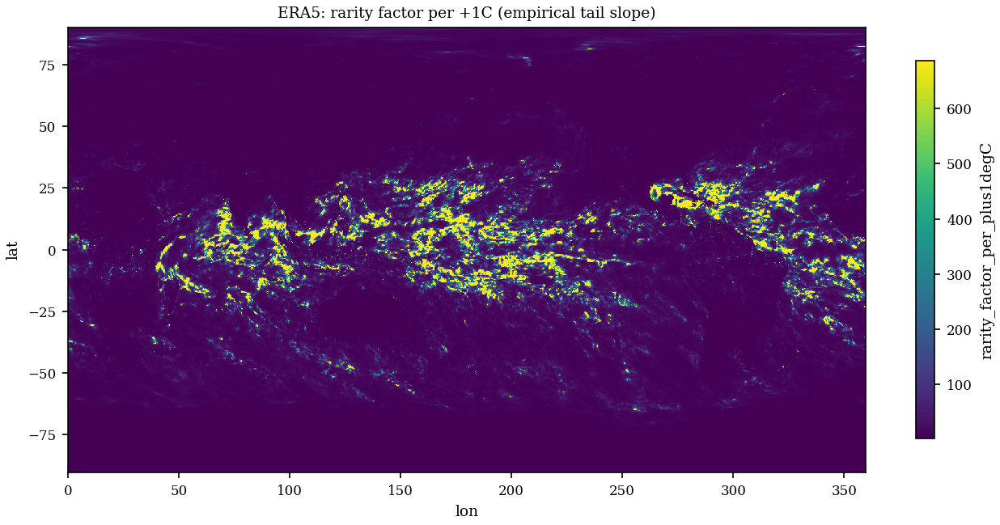

In [20]:

era5_da = load_era5_grid(ERA5_PATH, target_mmdd)
print(f"ERA5 grid: {dict(era5_da.sizes)}")
era5_out = empirical_tail_slope_grid(era5_da, "time")
era5_out = era5_out.load()  # materialize once -- to_netcdf/box_mean/plot below would each
# otherwise re-run the full lazy dask graph (re-read + refit the whole grid) from scratch
era5_out.to_netcdf(f"{OUT_PREFIX}_era5.nc")
print("ERA5 PNW-box cross-check:", box_mean(era5_out))
fig = plot_tail_slope_map(era5_out, title="ERA5: rarity factor per +1C (empirical tail slope)")
fig.savefig(f"{OUT_PREFIX}_era5.png")

In [ ]:
fig = plot_tail_slope_map(era5_out, title="ERA5: rarity factor per +1C (empirical tail slope)")

In [ ]:
xr.open_dataset('gridded_era5.nc')

In [ ]:
out

## Run: Reforecast (global)

/tmp/user/27340/ipykernel_2131969/3768270514.py:46: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_zarr(path)


Reforecast grid: {'lat': 721, 'lon': 1440, 'sample': 2420}
Reforecast PNW-box cross-check: {'slope': -0.6905961824213379, 'r2': 0.9807580159641464, 'rarity_factor_per_plus1degC': 2.008395410969031}


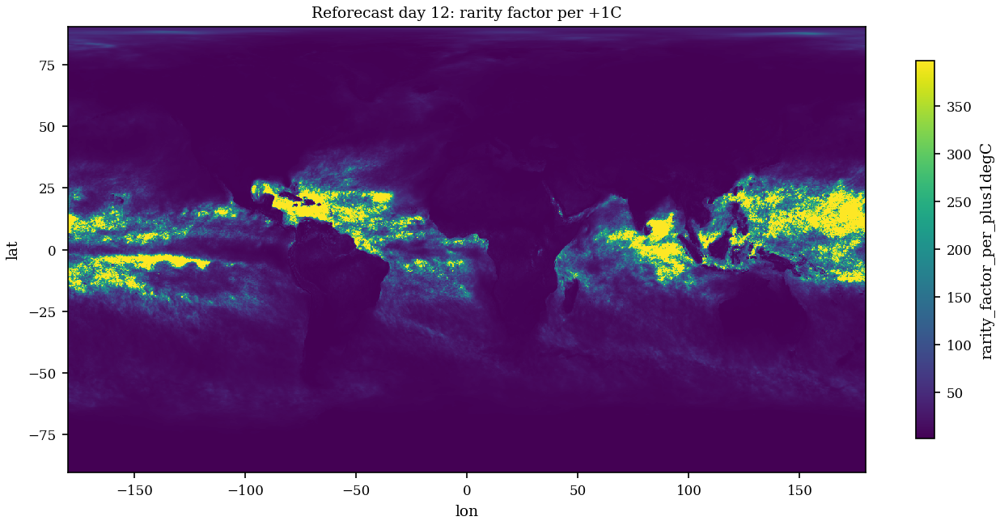

In [21]:

refore_da = load_reforecast_grid(REFORECAST_PATH, inidate_sel=selected_inidates)
print(f"Reforecast grid: {dict(refore_da.sizes)}")
refore_out = empirical_tail_slope_grid(refore_da, "sample")
refore_out = refore_out.load()  # see ERA5 comment above -- avoid 3x recompute of a 20GB read
refore_out.to_netcdf(f"{OUT_PREFIX}_reforecast.nc")
print("Reforecast PNW-box cross-check:", box_mean(refore_out))
fig = plot_tail_slope_map(refore_out, title=f"Reforecast day {LEAD_DAY}: rarity factor per +1C")
fig.savefig(f"{OUT_PREFIX}_reforecast.png")
     

## Run: CMIP (global, per model, no box restriction)

CMIP files: 6
  CNRM-CM6-1 grid: {'sample': 220, 'lat': 180, 'lon': 360}
  CNRM-CM6-1 PNW-box cross-check: {'slope': -0.7460434610183732, 'r2': 0.9260423569953804, 'rarity_factor_per_plus1degC': 2.145704032373353}
  CNRM-ESM2-1 grid: {'sample': 220, 'lat': 180, 'lon': 360}
  CNRM-ESM2-1 PNW-box cross-check: {'slope': -0.6243722100916724, 'r2': 0.9433777499172186, 'rarity_factor_per_plus1degC': 1.8721639089082196}
  EC-Earth3 grid: {'lat': 180, 'lon': 360, 'sample': 12100}
  EC-Earth3 PNW-box cross-check: {'slope': -0.6685981314901824, 'r2': 0.9773137703922103, 'rarity_factor_per_plus1degC': 1.9572226912228532}
  IPSL-CM6A-LR grid: {'lat': 180, 'lon': 360, 'sample': 1320}
  IPSL-CM6A-LR PNW-box cross-check: {'slope': -0.5709205090670254, 'r2': 0.9532306818038319, 'rarity_factor_per_plus1degC': 1.7729798183399001}
  MIROC6 grid: {'lat': 180, 'lon': 360, 'sample': 11000}
  MIROC6 PNW-box cross-check: {'slope': -1.0265684589633266, 'r2': 0.9794893116882964, 'rarity_factor_per_plus1degC': 2

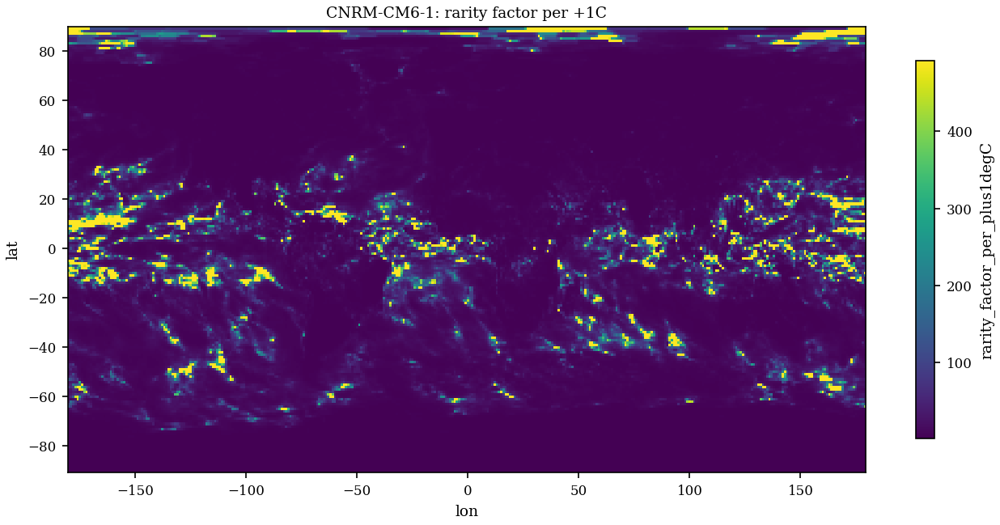

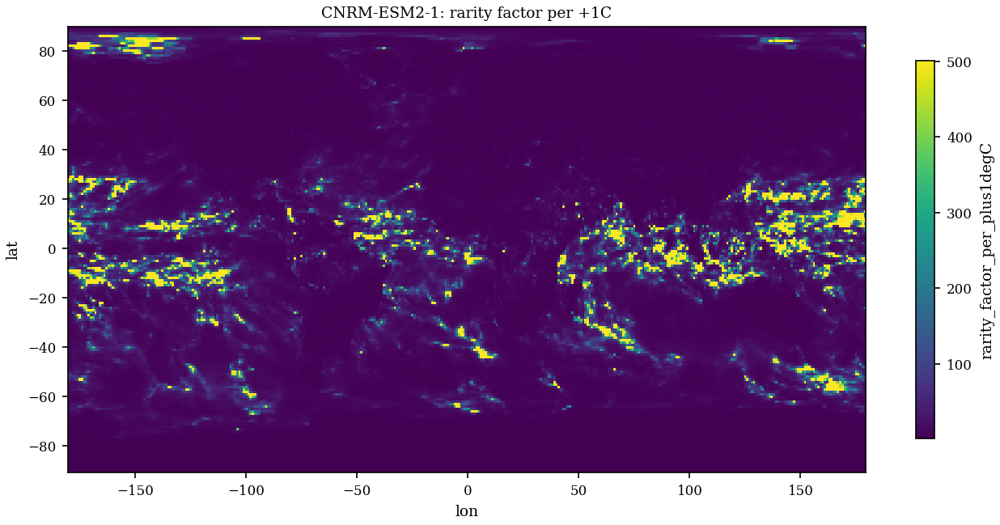

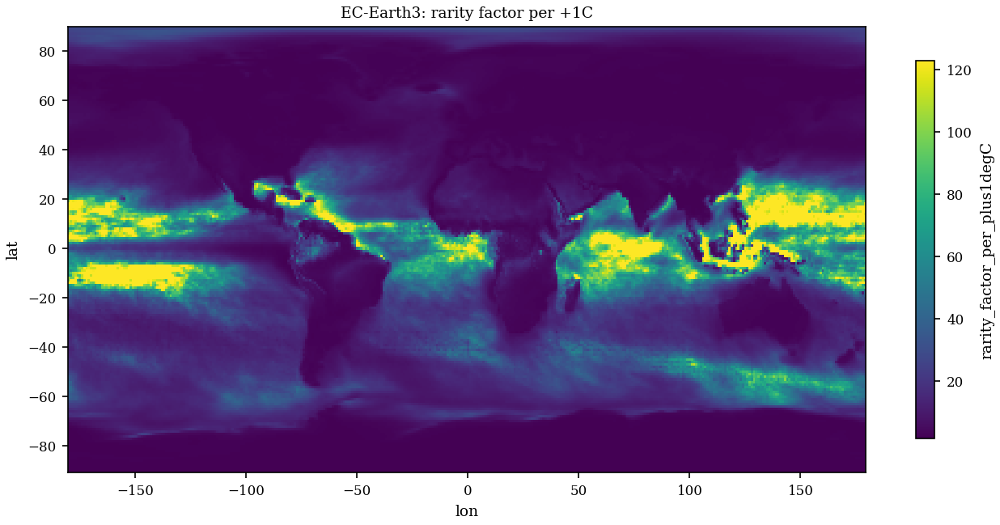

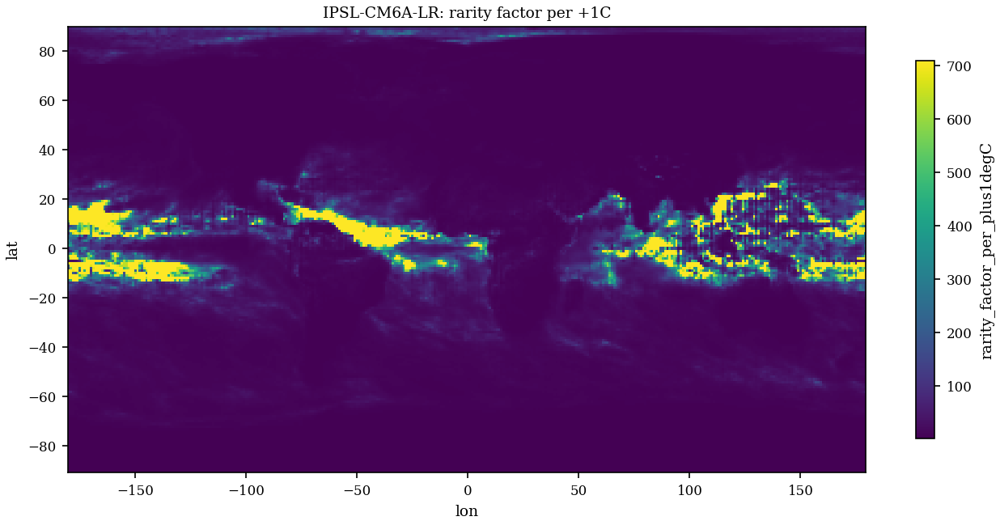

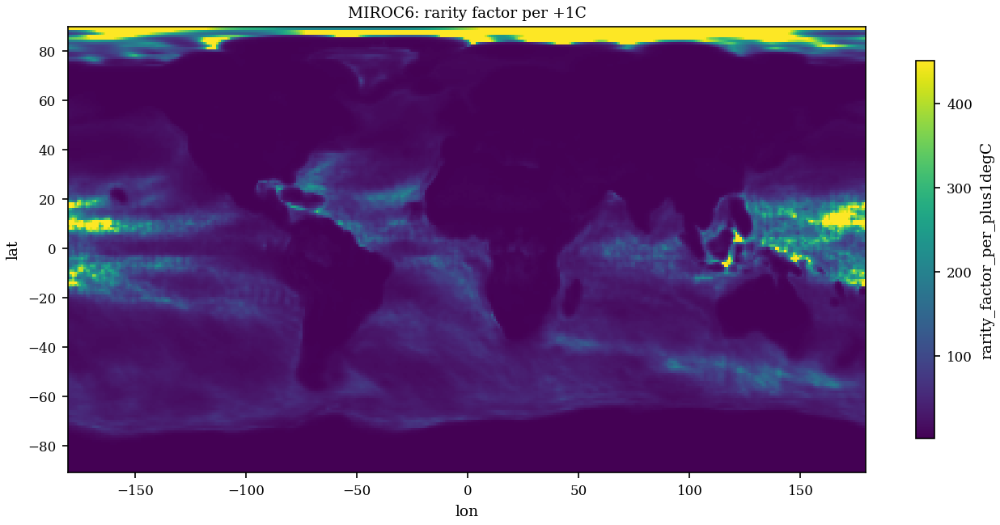

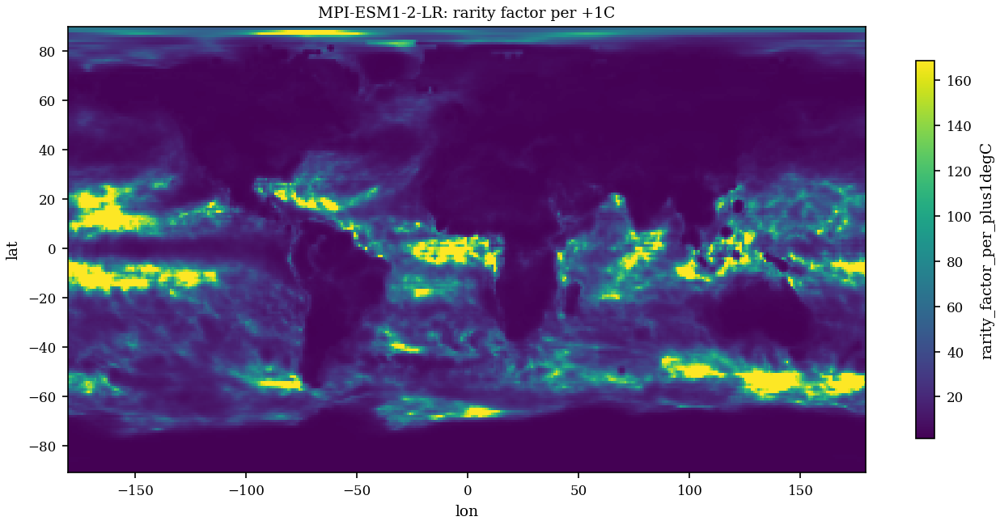

: 

In [ ]:
cmip_files = sorted(glob.glob(CMIP_GLOB))
print(f"CMIP files: {len(cmip_files)}")
for path in cmip_files:
    name = cmip_model_name(path)
    cmip_da = load_cmip_grid(path, target_mmdd)
    print(f"  {name} grid: {dict(cmip_da.sizes)}")
    cmip_out = empirical_tail_slope_grid(cmip_da, "sample")
    cmip_out = cmip_out.load()  # see ERA5 comment above
    cmip_out.to_netcdf(f"{OUT_PREFIX}_cmip_{name}.nc")
    print(f"  {name} PNW-box cross-check:", box_mean(cmip_out))
    fig = plot_tail_slope_map(cmip_out, title=f"{name}: rarity factor per +1C")
    fig.savefig(f"{OUT_PREFIX}_cmip_{name}.png")

print("Done.")
     

## Run: AMIP (global, per model)

In [8]:
def load_cmip_grid(path: str, target_mmdd: set, var: str = CMIP_VAR) -> xr.DataArray:
    """
    Loads one CMIP/AMIP model, filtered to target_mmdd. Handles both "member" (the historical_ssp
    files) and "member_id" (the AMIP dtree_zarr_output_now files) as the ensemble-member
    dimension name -- otherwise identical structure, so one loader covers both. Not every file
    has exactly one ensemble member -- when member > 1, pool them into the sample dimension as
    additional independent draws (same UNSEEN-style treatment already used for the reforecast's
    ensemble) instead of discarding all but one. Always returns a "sample" dim (renamed from
    "time" when there's only one member) so callers don't need to know which case applied.
    """
    ds = xr.open_dataset(path, chunks={})
    da = ds[var]
    mask = da["time"].dt.strftime("%m-%d").isin(sorted(target_mmdd))
    da = da.isel(time=mask.values)
    member_dim = next((d for d in ("member", "member_id") if d in da.dims), None)
    if member_dim is not None and da.sizes[member_dim] > 1:
        da = da.stack(sample=("time", member_dim))
    else:
        if member_dim is not None:
            da = da.squeeze(member_dim, drop=True)
        da = da.rename({"time": "sample"})
    da = _maybe_kelvin_to_celsius(da)
    da = da.chunk({"sample": -1, "lat": CHUNK_LAT, "lon": CHUNK_LON})
    return drop_nan_samples(da, "sample")

In [13]:
amip_files = sorted(glob.glob(AMIP_GLOB))
print(f"AMIP files: {len(amip_files)}")
for path in amip_files:
    name = cmip_model_name(path)
    amip_da = load_cmip_grid(path, target_mmdd)
    print(f"  {name} (AMIP) grid: {dict(amip_da.sizes)}")
    amip_out = empirical_tail_slope_grid(amip_da, "sample")
    amip_out = amip_out.load()  # see ERA5 comment above
    amip_out.to_netcdf(f"{OUT_PREFIX}_amip_{name}.nc")
    print(f"  {name} (AMIP) PNW-box cross-check:", box_mean(amip_out))
    #fig = plot_tail_slope_map(amip_out, title=f"{name} (AMIP): rarity factor per +1C")
    #fig.savefig(f"{OUT_PREFIX}_amip_{name}.png")

print("Done.")
     

AMIP files: 4
  CNRM-CM6-1 (AMIP) grid: {'sample': 220, 'lat': 180, 'lon': 360}
  CNRM-CM6-1 (AMIP) PNW-box cross-check: {'slope': -0.5034450367839749, 'r2': 0.8946166784822888, 'rarity_factor_per_plus1degC': 1.6782313691996056}
  CNRM-ESM2-1 (AMIP) grid: {'sample': 220, 'lat': 180, 'lon': 360}
  CNRM-ESM2-1 (AMIP) PNW-box cross-check: {'slope': -0.6601004995513233, 'r2': 0.9319993263467347, 'rarity_factor_per_plus1degC': 1.973447452232377}
  HadGEM3-GC31-LL (AMIP) grid: {'lat': 180, 'lon': 360, 'sample': 880}
  HadGEM3-GC31-LL (AMIP) PNW-box cross-check: {'slope': -0.6171679497134113, 'r2': 0.9530270559888684, 'rarity_factor_per_plus1degC': 1.8592292012943874}
  IPSL-CM6A-LR (AMIP) grid: {'lat': 180, 'lon': 360, 'sample': 1100}
  IPSL-CM6A-LR (AMIP) PNW-box cross-check: {'slope': -0.5676261542215265, 'r2': 0.9630152079477851, 'rarity_factor_per_plus1degC': 1.7658520276043983}
Done.


In [9]:
from xarray import DataTree
from pathlib import Path

files = ["gridded_era5.nc",
         "gridded_reforecast.nc",

    "gridded_cmip_EC-Earth3.nc",
    "gridded_cmip_MIROC6.nc",
    "gridded_cmip_MPI-ESM1-2-LR.nc",
    "gridded_amip_CNRM-ESM2-1.nc",
    "gridded_amip_CNRM-CM6-1.nc",
    "gridded_amip_IPSL-CM6A-LR.nc",
    
    
    
    "gridded_amip_HadGEM3-GC31-LL.nc",
]

tree = DataTree()

for f in files:
    name = Path(f).stem.replace("gridded_", "")
    tree[name] = DataTree(xr.open_dataset(f,decode_times=True))

tree

/tmp/user/27340/ipykernel_2723171/3248206636.py:23: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  tree[name] = DataTree(xr.open_dataset(f,decode_times=True))


<xarray.DataTree>
Group: /
├── Group: /era5
│       Dimensions:                      (lat: 721, lon: 1440)
│       Coordinates:
│         * lat                          (lat) float32 3kB 90.0 89.75 ... -89.75 -90.0
│         * lon                          (lon) float32 6kB 0.0 0.25 0.5 ... 359.5 359.8
│       Data variables:
│           threshold                    (lat, lon) float32 4MB ...
│           slope                        (lat, lon) float64 8MB ...
│           intercept                    (lat, lon) float64 8MB ...
│           r2                           (lat, lon) float64 8MB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 8MB ...
│       Attributes:
│           m:                     11
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /reforecast
│       Dimensions:                      (lat: 721, lon: 1440)
│       Coordinates:
│           experiment                   <U3 12B ...
│         * lat                          (lat) float32 3kB 90.0 89.75 ... -89.75 -90.0
│         * lon                          (lon) float32 6kB -180.0 -179.8 ... 179.5 179.8
│           time                         timedelta64[ns] 8B ...
│       Data variables:
│           threshold                    (lat, lon) float32 4MB ...
│           slope                        (lat, lon) float64 8MB ...
│           intercept                    (lat, lon) float64 8MB ...
│           r2                           (lat, lon) float64 8MB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 8MB ...
│       Attributes:
│           m:                     121
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_EC-Earth3
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│           height                       float64 8B ...
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                           (lat, lon) float64 518kB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 518kB ...
│       Attributes:
│           m:                     605
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_MIROC6
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│           height                       float64 8B ...
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                           (lat, lon) float64 518kB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 518kB ...
│       Attributes:
│           m:                     550
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_MPI-ESM1-2-LR
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│           height                       float64 8B ...
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                 

In [17]:
from pathlib import Path
import xarray as xr
from xarray import DataTree  # or `from xarray import DataTree` in newer xarray versions
files = glob.glob("gridded_*.nc")

In [18]:
tree = DataTree()

for f in files:
    name = Path(f).stem.replace("gridded_", "")
    tree[name] = DataTree(xr.open_dataset(f,decode_times=True))

tree

/tmp/user/27340/ipykernel_2697947/3478173450.py:5: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  tree[name] = DataTree(xr.open_dataset(f,decode_times=True))


<xarray.DataTree>
Group: /
├── Group: /cmip_CNRM-ESM2-1
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│           height                       float64 8B ...
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                           (lat, lon) float64 518kB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 518kB ...
│       Attributes:
│           m:                     11
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_CNRM-CM6-1
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│           height                       float64 8B ...
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                           (lat, lon) float64 518kB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 518kB ...
│       Attributes:
│           m:                     11
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_EC-Earth3
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│           height                       float64 8B ...
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept                    (lat, lon) float64 518kB ...
│           r2                           (lat, lon) float64 518kB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 518kB ...
│       Attributes:
│           m:                     605
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /reforecast
│       Dimensions:                      (lat: 721, lon: 1440)
│       Coordinates:
│           experiment                   <U3 12B ...
│         * lat                          (lat) float32 3kB 90.0 89.75 ... -89.75 -90.0
│         * lon                          (lon) float32 6kB -180.0 -179.8 ... 179.5 179.8
│           time                         timedelta64[ns] 8B ...
│       Data variables:
│           threshold                    (lat, lon) float32 4MB ...
│           slope                        (lat, lon) float64 8MB ...
│           intercept                    (lat, lon) float64 8MB ...
│           r2                           (lat, lon) float64 8MB ...
│           rarity_factor_per_plus1degC  (lat, lon) float64 8MB ...
│       Attributes:
│           m:                     121
│           threshold_percentile:  95
│           anomaly:               1
├── Group: /cmip_IPSL-CM6A-LR
│       Dimensions:                      (lat: 180, lon: 360)
│       Coordinates:
│           height                       float64 8B ...
│         * lat                          (lat) float64 1kB -90.0 -89.0 ... 88.0 89.0
│         * lon                          (lon) float64 3kB -180.0 -179.0 ... 178.0 179.0
│       Data variables:
│           threshold                    (lat, lon) float32 259kB ...
│           slope                        (lat, lon) float64 518kB ...
│           intercept  

In [21]:
rarity = {
    name: node.ds["rarity_factor_per_plus1degC"]
    for name, node in tree.children.items()
}

In [10]:
das = [
    node.ds["rarity_factor_per_plus1degC"]
    for node in tree.children.values()
]

titles = list(tree.children.keys())

In [11]:
das

[<xarray.DataArray 'rarity_factor_per_plus1degC' (lat: 721, lon: 1440)> Size: 8MB
 [1038240 values with dtype=float64]
 Coordinates:
   * lat      (lat) float32 3kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
   * lon      (lon) float32 6kB 0.0 0.25 0.5 0.75 1.0 ... 359.0 359.2 359.5 359.8,
 <xarray.DataArray 'rarity_factor_per_plus1degC' (lat: 721, lon: 1440)> Size: 8MB
 [1038240 values with dtype=float64]
 Coordinates:
     experiment  <U3 12B ...
   * lat         (lat) float32 3kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
   * lon         (lon) float32 6kB -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
     time        timedelta64[ns] 8B ...,
 <xarray.DataArray 'rarity_factor_per_plus1degC' (lat: 180, lon: 360)> Size: 518kB
 [64800 values with dtype=float64]
 Coordinates:
   * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 86.0 87.0 88.0 89.0
   * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 177.0 178.0 179.0
     height   float64 8B ...,
 <xarray.DataArray 'ra

/tmp/user/27340/ipykernel_2723171/3854743487.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.02, 1, 1])


Saved: global_upper_tail_maps.png


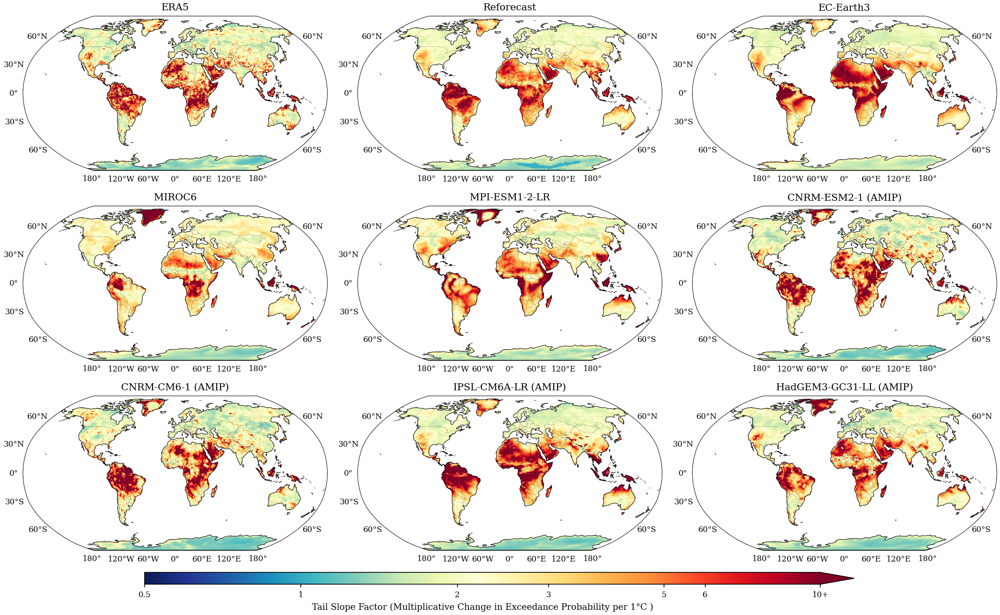

In [12]:
title_map = {
    "era5": "ERA5",
    "reforecast": "Reforecast",
    "cmip_EC-Earth3": "EC-Earth3",
    "cmip_CNRM-CM6-1": "CNRM-CM6-1",
    "cmip_CNRM-ESM2-1": "CNRM-ESM2-1",
    "cmip_IPSL-CM6A-LR": "IPSL-CM6A-LR",
    "cmip_MIROC6": "MIROC6",
    "cmip_MPI-ESM1-2-LR": "MPI-ESM1-2-LR",
    "amip_CNRM-CM6-1": "CNRM-CM6-1 (AMIP)",
    "amip_CNRM-ESM2-1": "CNRM-ESM2-1 (AMIP)",
    "amip_IPSL-CM6A-LR": "IPSL-CM6A-LR (AMIP)",
    "amip_HadGEM3-GC31-LL": "HadGEM3-GC31-LL (AMIP)",
}

titles = [title_map.get(name, name) for name in tree.children]

norm = mcolors.LogNorm(vmin=0.5, vmax=10)
ticks = [0.5, 1, 2, 3,5,6,10]
labels = ["0.5", "1", "2", "3","5","6", "10+"]
plot_sensitivity_maps(
    das,
    titles=titles,
    ticks=ticks,
    labels=labels,save_path="global_upper_tail_maps.png"
)

# Regional Boxes

In [65]:
# ── Your inputs -- edit these ────────────────────────────────────────────────
data_list = das       # your list of DataArrays (rarity_factor_per_plus1degC, global)
model_names = titles    # same order, used as row labels

REGIONS = {
    "PNW": ((45, 52), (-123, -119)),
    "Sahara": ((20, 28), (0, 15)),
    "Amazon Basin": ((-8, 3), (-70, -55)),
    "Siberia": ((60, 68), (90, 120)),
}



REGIONS = {
    "PNW": ((42, 55), (-128, -115)),
    "Sahara": ((17, 31), (-5, 20)),
    "Amazon Basin": ((-12, 7), (-75, -50)),
    "Siberia": ((57, 71), (82, 128)),
}

REGIONS = {
    "South Asia": ((5, 30), (65, 95)),
    "Maritime Continent": ((-10, 15), (95, 135)),
    "Amazon Basin": ((-12, 8), (-75, -50)),
    "PNW": ((40, 57), (-130, -112)),
}


REGIONS = {
    "PNW": ((30, 60), (-136, -100)),
    "Amazon Basin": ((-8, 10), (-72, -48)),
    "South Asia": ((5, 30), (65, 95)),
    "Maritime Continent": ((-10, 15), (95, 135)),
}

In [66]:
vmin, vmax = 0.5, 10
ticks = [0.5, 1, 2, 5, 10]
labels = ["0.5", "1", "2", "5", "10+"]
cmap = my_colormap  # or any other colormap you prefer
save_path = "regional_sensitivity_grid_one_bar.png"


In [67]:
model_names

['ERA5',
 'Reforecast',
 'EC-Earth3',
 'MIROC6',
 'MPI-ESM1-2-LR',
 'CNRM-ESM2-1 (AMIP)',
 'CNRM-CM6-1 (AMIP)',
 'IPSL-CM6A-LR (AMIP)',
 'HadGEM3-GC31-LL (AMIP)']

In [68]:


norm = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)

def plot_group(model_names, data_list, save_path, group_title):
    nrows, ncols = len(data_list), len(REGIONS)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(2.4 * ncols + 1.0, 2.0 * nrows + 0.8),
        subplot_kw={"projection": ccrs.PlateCarree()},
    )

    # make sure axes is always 2D
    if nrows == 1:
        axes = axes[None, :]

    im = None

    for i, (name, da) in enumerate(zip(model_names, data_list)):
        for j, (region_name, (lat_b, lon_b)) in enumerate(REGIONS.items()):
            ax = axes[i, j]

            lon_lo, lon_hi = lon_b
            if float(da["lon"].min()) >= 0:
                lon_lo, lon_hi = lon_lo % 360, lon_hi % 360

            lat_lo, lat_hi = min(lat_b), max(lat_b)
            lon_lo, lon_hi = min(lon_lo, lon_hi), max(lon_lo, lon_hi)

            box = da.sel(lat=slice(lat_lo, lat_hi), lon=slice(lon_lo, lon_hi))
            if box.sizes["lat"] == 0:
                box = da.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi))

            im = box.plot.pcolormesh(
                ax=ax,
                transform=ccrs.PlateCarree(),
                norm=norm,
                cmap=cmap,
                add_colorbar=False,
                shading="auto",
                rasterized=True,
            )

            ax.coastlines()
            ax.add_feature(cfeature.LAND, facecolor="none")
            ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
            ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)

            if i == 0:
                ax.set_title(region_name, fontsize=9)
            else:
                ax.set_title("")

            if j == 0:
                ax.text(
                    -0.25, 0.5, name,
                    transform=ax.transAxes,
                    rotation=90,
                    va="center",
                    ha="center",
                    fontsize=9,
                )

    fig.suptitle(group_title, fontsize=11, y=0.98)
    fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.085, hspace=0.15, wspace=0.1)

    cax = fig.add_axes([0.13, 0.03, 0.74, 0.02])
    cbar = fig.colorbar(im, cax=cax, orientation="horizontal", extend="max")
    cbar.set_ticks(ticks)
    cbar.ax.minorticks_off()
    cbar.set_ticklabels(labels)
    cbar.set_label("Tail slope factor (Multiplicative Change in Exceedance Probability per 1°C)")

    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

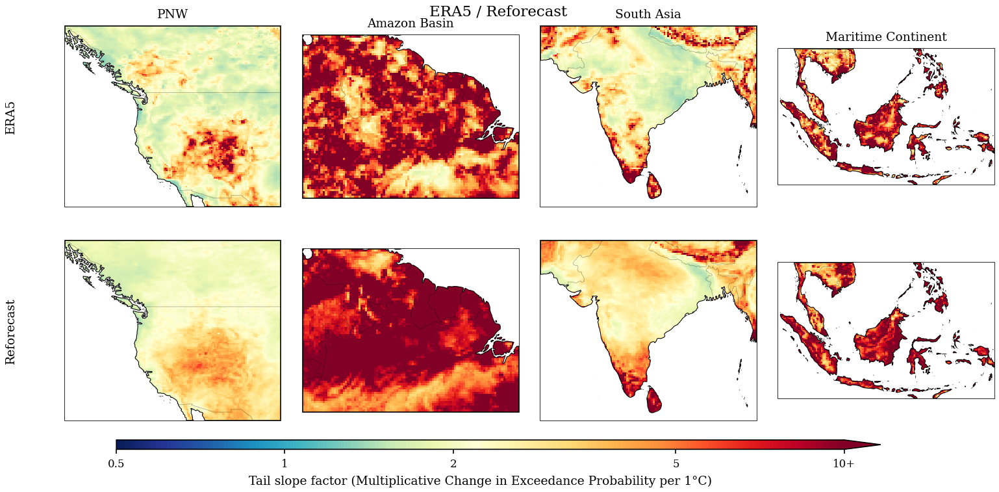

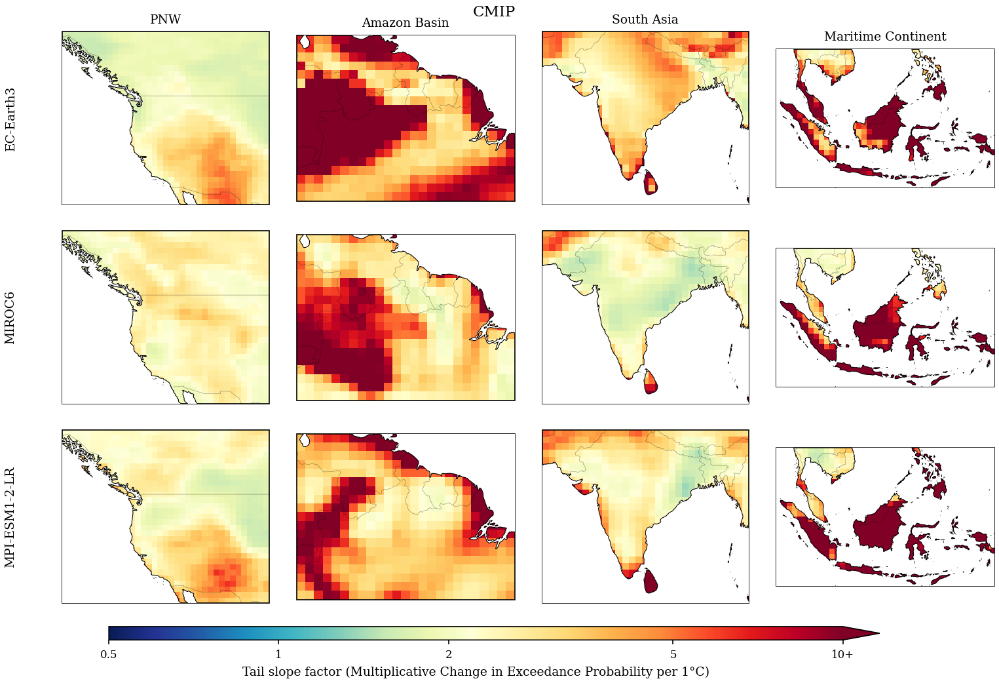

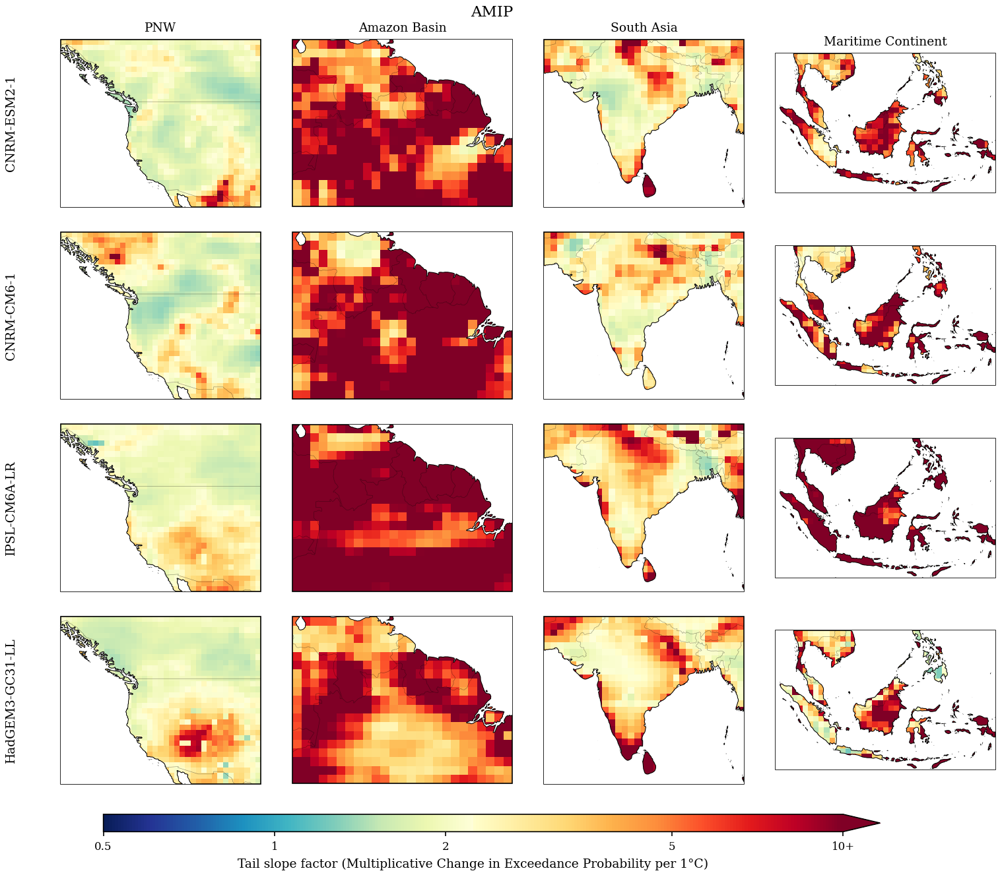

In [69]:
import xarray as xr

# Variable to plot (replace with your variable name if different)
varname = "rarity_factor_per_plus1degC"

# Split the DataTree into groups
child_names = list(tree.children)

era5_reforecast_names = [n for n in child_names if n in {"era5", "reforecast"}]
cmip_names = [n for n in child_names if n.startswith("cmip_")]
amip_names = [n for n in child_names if n.startswith("amip_")]

def get_da(ds, varname=None):
    if isinstance(ds, xr.DataArray):
        return ds
    if varname is None:
        if len(ds.data_vars) != 1:
            raise ValueError(f"Dataset has multiple variables: {list(ds.data_vars)}")
        varname = next(iter(ds.data_vars))
    return ds[varname]

# DataArrays
era5_reforecast_data = [get_da(tree[n].ds, varname) for n in era5_reforecast_names]
cmip_data = [get_da(tree[n].ds, varname) for n in cmip_names]
amip_data = [get_da(tree[n].ds, varname) for n in amip_names]

# Labels
era5_reforecast_labels = ["ERA5", "Reforecast"]
cmip_labels = [n.replace("cmip_", "") for n in cmip_names]
amip_labels = [n.replace("amip_", "") for n in amip_names]

# Plot
plot_group(
    era5_reforecast_labels,
    era5_reforecast_data,
    "era5_reforecast.png",
    "ERA5 / Reforecast",
)

plot_group(
    cmip_labels,
    cmip_data,
    "cmip.png",
    "CMIP",
)

plot_group(
    amip_labels,
    amip_data,
    "amip.png",
    "AMIP",
)

Saved: regional_sensitivity_grid_one_bar.png


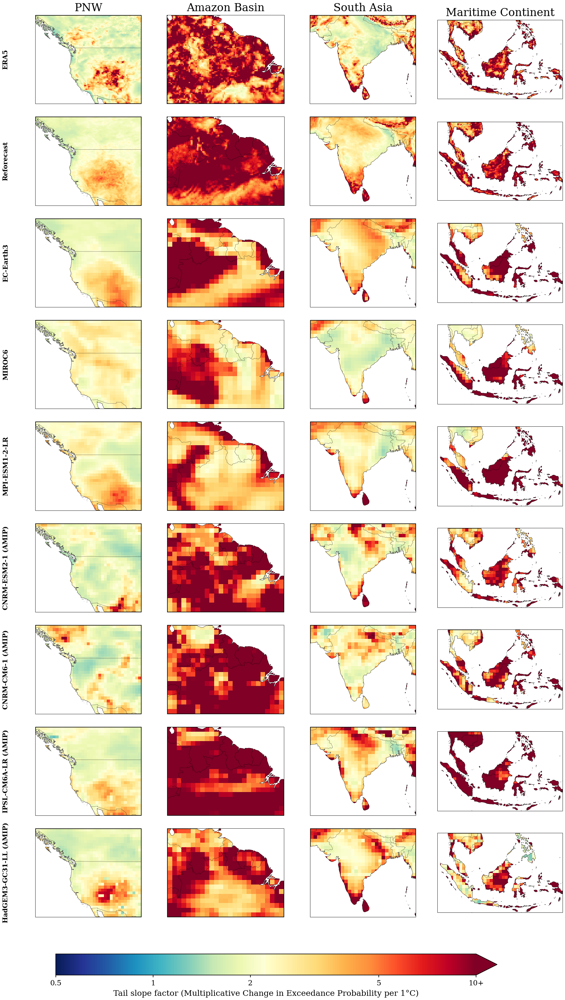

In [70]:
# Typography / sizing tweaks for the full figure
PANEL_W, PANEL_H = 2.6, 2.15
TITLE_FS = 15
ROWLABEL_FS = 9
CBAR_FS = 11
CBAR_TICK_FS = 10

norm = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)

nrows, ncols = len(data_list), len(REGIONS)
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(PANEL_W * ncols + 1.0, PANEL_H * nrows + 0.8),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

for i, (name, da) in enumerate(zip(model_names, data_list)):
    for j, (region_name, (lat_b, lon_b)) in enumerate(REGIONS.items()):
        ax = axes[i, j]

        lon_lo, lon_hi = lon_b
        if float(da["lon"].min()) >= 0:
            lon_lo, lon_hi = lon_lo % 360, lon_hi % 360
        lat_lo, lat_hi = min(lat_b), max(lat_b)
        lon_lo, lon_hi = min(lon_lo, lon_hi), max(lon_lo, lon_hi)

        box = da.sel(lat=slice(lat_lo, lat_hi), lon=slice(lon_lo, lon_hi))
        if box.sizes["lat"] == 0:
            box = da.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi))

        im = box.plot.pcolormesh(
            ax=ax,
            transform=ccrs.PlateCarree(),
            norm=norm,
            cmap=cmap,
            add_colorbar=False,
            shading="auto",
            rasterized=True,
        )

        ax.coastlines(linewidth=0.6)
        ax.add_feature(cfeature.LAND, facecolor="none")
        ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
        ax.add_feature(cfeature.BORDERS, linewidth=0.4, alpha=0.5)

        if i == 0:
            ax.set_title(region_name, fontsize=TITLE_FS)
        else:
            ax.set_title("")

        if j == 0:
            ax.text(
                -0.28, 0.5, name,
                transform=ax.transAxes,
                rotation=90,
                va="center",
                ha="center",
                fontsize=ROWLABEL_FS,
                fontweight="bold",
            )

fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.085, hspace=0.15, wspace=0.1)

cax = fig.add_axes([0.13, 0.03, 0.74, 0.02])
cbar = fig.colorbar(im, cax=cax, orientation="horizontal", extend="max")
cbar.set_ticks(ticks)
cbar.ax.minorticks_off()
cbar.set_ticklabels(labels)
cbar.ax.tick_params(labelsize=CBAR_TICK_FS)
cbar.set_label(
    "Tail slope factor (Multiplicative Change in Exceedance Probability per 1°C)",
    fontsize=CBAR_FS,
)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Saved: {save_path}")
plt.show()

In [71]:

norm = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)

def plot_group(model_names, data_list, save_path, group_title):
    nrows, ncols = len(data_list), len(REGIONS)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(2.4 * ncols + 1.0, 2.0 * nrows + 0.8),
        subplot_kw={"projection": ccrs.PlateCarree()},
    )

    # make sure axes is always 2D
    if nrows == 1:
        axes = axes[None, :]

    im = None

    for i, (name, da) in enumerate(zip(model_names, data_list)):
        for j, (region_name, (lat_b, lon_b)) in enumerate(REGIONS.items()):
            ax = axes[i, j]

            lon_lo, lon_hi = lon_b
            if float(da["lon"].min()) >= 0:
                lon_lo, lon_hi = lon_lo % 360, lon_hi % 360

            lat_lo, lat_hi = min(lat_b), max(lat_b)
            lon_lo, lon_hi = min(lon_lo, lon_hi), max(lon_lo, lon_hi)

            box = da.sel(lat=slice(lat_lo, lat_hi), lon=slice(lon_lo, lon_hi))
            if box.sizes["lat"] == 0:
                box = da.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi))

            im = box.plot.pcolormesh(
                ax=ax,
                transform=ccrs.PlateCarree(),
                norm=norm,
                cmap=cmap,
                add_colorbar=False,
                shading="auto",
                rasterized=True,
            )

            ax.coastlines()
            ax.add_feature(cfeature.LAND, facecolor="none")
            ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
            ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)

            if i == 0:
                ax.set_title(region_name, fontsize=9)

            if j == 0:
                ax.text(
                    -0.25, 0.5, name,
                    transform=ax.transAxes,
                    rotation=90,
                    va="center",
                    ha="center",
                    fontsize=9,
                )

    fig.suptitle(group_title, fontsize=11, y=0.98)
    fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.085, hspace=0.15, wspace=0.1)

    cax = fig.add_axes([0.13, 0.03, 0.74, 0.02])
    cbar = fig.colorbar(im, cax=cax, orientation="horizontal", extend="max")
    cbar.set_ticks(ticks)
    cbar.ax.minorticks_off()
    cbar.set_ticklabels(labels)
    cbar.set_label("Tail slope factor (× change in exceedance probability per 1°C)")

    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

Saved: regional_sensitivity_grid_one_bar.png


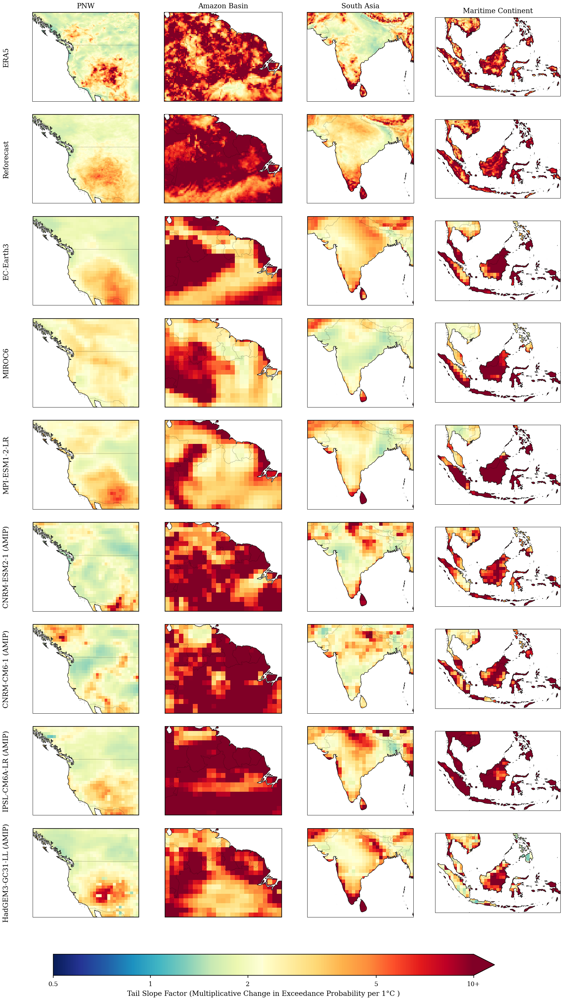

In [72]:
# ── Figure sizing -- tweak these for the paper ───────────────────────────────
PANEL_W, PANEL_H = 2.4, 2.0   # inches per panel

# ── Plot ──────────────────────────────────────────────────────────────────────
nrows, ncols = len(data_list), len(REGIONS)
fig, axes = plt.subplots(
    nrows, ncols, figsize=(PANEL_W * ncols + 1.0, PANEL_H * nrows + 0.8),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

norm = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)

for i, (name, da) in enumerate(zip(model_names, data_list)):
    for j, (region_name, (lat_b, lon_b)) in enumerate(REGIONS.items()):
        ax = axes[i, j]

        # crop to the region box -- handles both 0..360 (ERA5) and -180..180 (CMIP/reforecast) lon
        lon_lo, lon_hi = lon_b
        if float(da["lon"].min()) >= 0:
            lon_lo, lon_hi = lon_lo % 360, lon_hi % 360
        lat_lo, lat_hi = min(lat_b), max(lat_b)
        lon_lo, lon_hi = min(lon_lo, lon_hi), max(lon_lo, lon_hi)
        box = da.sel(lat=slice(lat_lo, lat_hi), lon=slice(lon_lo, lon_hi))
        if box.sizes["lat"] == 0:  # descending-latitude grid (ERA5/reforecast) needs the reversed slice
            box = da.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi))

        im = box.plot.pcolormesh(
            ax=ax,
            transform=ccrs.PlateCarree(),
            norm=norm,
            cmap=cmap,
            add_colorbar=False,
            shading="auto",
            rasterized=True,
        )
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor="none")
        ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)
        ax.set_title(region_name if i == 0 else "", fontsize=9)

        if j == 0:
            ax.text(-0.25, 0.5, name, transform=ax.transAxes, rotation=90,
                     va="center", ha="center", fontsize=9)

fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.085, hspace=0.15, wspace=0.1)

cax = fig.add_axes([0.13, 0.03, 0.74, 0.02])
cbar = fig.colorbar(im, cax=cax, orientation="horizontal", extend="max")
cbar.set_ticks(ticks)
cbar.ax.minorticks_off()
cbar.set_ticklabels(labels)
cbar.set_label("Tail Slope Factor (Multiplicative Change in Exceedance Probability per 1°C )")

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Saved: {save_path}")
plt.show()

Saved: regional_sensitivity_grid.png


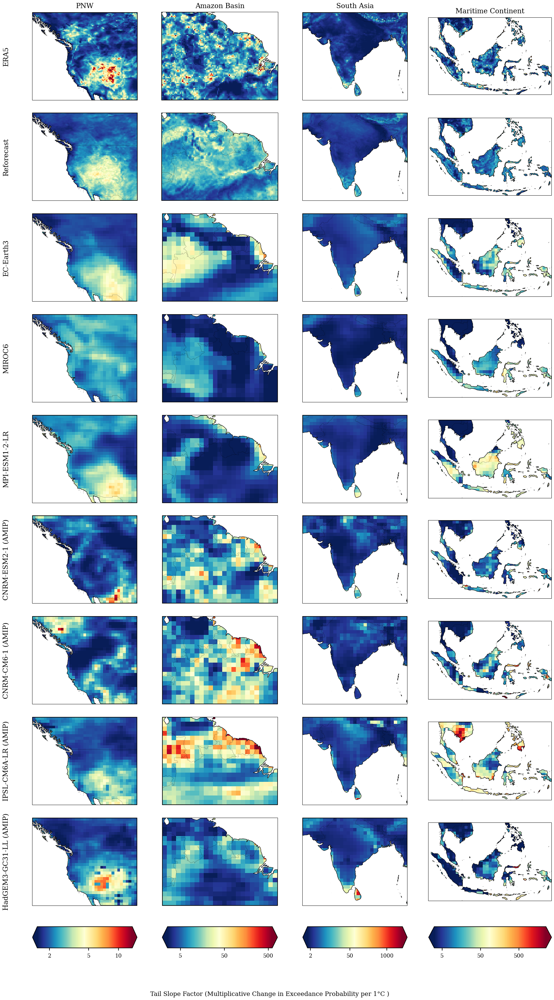

In [73]:
save_path = "regional_sensitivity_grid.png"
from matplotlib.ticker import LogLocator
# ── Figure sizing -- tweak these for the paper ───────────────────────────────
PANEL_W, PANEL_H = 2.4, 2.0   # inches per panel

# ── Crop helper (inline, not a separate module) ─────────────────────────────
def crop(da, lat_b, lon_b):
    lon_lo, lon_hi = lon_b
    if float(da["lon"].min()) >= 0:
        lon_lo, lon_hi = lon_lo % 360, lon_hi % 360
    lat_lo, lat_hi = min(lat_b), max(lat_b)
    lon_lo, lon_hi = min(lon_lo, lon_hi), max(lon_lo, lon_hi)
    box = da.sel(lat=slice(lat_lo, lat_hi), lon=slice(lon_lo, lon_hi))
    if box.sizes["lat"] == 0:  # descending-latitude grid (ERA5/reforecast) needs the reversed slice
        box = da.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi))
    return box

# ── Crop everything first, and compute a per-region (per-column) color scale,
#    pooled across all models -- so models stay comparable within a region,
#    but different regions get whatever range actually suits their own data ──
region_names = list(REGIONS.keys())
crops = {region: [crop(da, *REGIONS[region]) for da in data_list] for region in region_names}

def nice_log_ticks(vmin, vmax, max_ticks=3):
    ticks = [t for t in LogLocator(base=10, subs=(1, 2, 5)).tick_values(vmin, vmax) if vmin <= t <= vmax]
    if len(ticks) > max_ticks:
        step = int(np.ceil(len(ticks) / max_ticks))
        ticks = ticks[::step]
    return ticks

region_norm, region_ticks, region_labels = {}, {}, {}
for region in region_names:
    pooled = np.concatenate([c.values.ravel() for c in crops[region]])
    vmin, vmax = np.nanpercentile(pooled, [2, 98])
    region_norm[region] = mcolors.LogNorm(vmin=vmin, vmax=vmax, clip=True)
    ticks = nice_log_ticks(vmin, vmax)
    region_ticks[region] = ticks
    region_labels[region] = [f"{t:g}" for t in ticks]

# ── Plot ──────────────────────────────────────────────────────────────────────
nrows, ncols = len(data_list), len(region_names)
fig, axes = plt.subplots(
    nrows, ncols, figsize=(PANEL_W * ncols + 1.0, PANEL_H * nrows + 1.2),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

region_mesh = {}
for i, name in enumerate(model_names):
    for j, region in enumerate(region_names):
        ax = axes[i, j]
        box = crops[region][i]
        im = box.plot.pcolormesh(
            ax=ax,
            transform=ccrs.PlateCarree(),
            norm=region_norm[region],
            cmap=cmap,
            add_colorbar=False,
            shading="auto",
            rasterized=True,
        )
        region_mesh[region] = im  # last row's mesh is fine -- same norm/cmap for the whole column
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor="none")
        ax.add_feature(cfeature.OCEAN, facecolor="white", zorder=10)
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.4)
        ax.set_title(region if i == 0 else "", fontsize=9)

        if j == 0:
            ax.text(-0.25, 0.5, name, transform=ax.transAxes, rotation=90,
                     va="center", ha="center", fontsize=9)

fig.subplots_adjust(left=0.08, right=0.98, top=0.94, bottom=0.1, hspace=0.15, wspace=0.1)

# one horizontal colorbar per region, positioned under its own column
pos0 = axes[-1, 0].get_position()
for j, region in enumerate(region_names):
    pos = axes[-1, j].get_position()
    cax = fig.add_axes([pos.x0, 0.06, pos.width, 0.02])
    cbar = fig.colorbar(region_mesh[region], cax=cax, orientation="horizontal", extend="both")
    cbar.set_ticks(region_ticks[region])
    cbar.ax.minorticks_off()
    cbar.set_ticklabels(region_labels[region])
    cbar.ax.tick_params(labelsize=7)

fig.text(0.5, 0.015, "Tail Slope Factor (Multiplicative Change in Exceedance Probability per 1°C )",
          ha="center", fontsize=8)

fig.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"Saved: {save_path}")
plt.show()